# Bank Customer Segmentation

The competition in the banking sector is increasing. To improve their services and retain and attract clients, banking and non-bank institutions need to modernize their marketing and customer strategies through personalization.

In this project, we segment Indian bank customers using data from more than one million transactions

# Import labraries

In [1]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime as dt, timedelta
import plotly.express as px
import plotly.graph_objects as go
import plotly.colors
import scipy.stats as stats

In [ ]:
# Surpress warnings:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

# Load dataset

In [2]:
df = pd.read_csv('dataset/bank_transactions.csv')

# Quick glance at the data

In [3]:
df.head()

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
0,T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.0
1,T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.0
2,T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.0
3,T4,C5342380,14/9/73,F,MUMBAI,866503.21,2/8/16,142714,2060.0
4,T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.5


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048567 entries, 0 to 1048566
Data columns (total 9 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   TransactionID            1048567 non-null  object 
 1   CustomerID               1048567 non-null  object 
 2   CustomerDOB              1045170 non-null  object 
 3   CustGender               1047467 non-null  object 
 4   CustLocation             1048416 non-null  object 
 5   CustAccountBalance       1046198 non-null  float64
 6   TransactionDate          1048567 non-null  object 
 7   TransactionTime          1048567 non-null  int64  
 8   TransactionAmount (INR)  1048567 non-null  float64
dtypes: float64(2), int64(1), object(6)
memory usage: 72.0+ MB


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustAccountBalance,1046198.0,115403.540056,846485.380601,0.0,4721.76,16792.18,57657.36,1.150355e+08
TransactionTime,1048567.0,157087.529393,51261.854022,0.0,124030.00,164226.00,200010.00,2.359590e+05
TransactionAmount (INR),1048567.0,1574.335003,6574.742978,0.0,161.00,459.03,1200.00,1.560035e+06


In [3]:
df.isnull().sum()

TransactionID                 0
CustomerID                    0
CustomerDOB                3397
CustGender                 1100
CustLocation                151
CustAccountBalance         2369
TransactionDate               0
TransactionTime               0
TransactionAmount (INR)       0
dtype: int64

# Data cleanup

In [4]:
# drop missing values
df.dropna(inplace = True)

In [5]:
df.isnull().sum()

TransactionID              0
CustomerID                 0
CustomerDOB                0
CustGender                 0
CustLocation               0
CustAccountBalance         0
TransactionDate            0
TransactionTime            0
TransactionAmount (INR)    0
dtype: int64

In [6]:
df_copy = df.copy()

In [7]:
# Fix date columns
df_copy['CustomerDOB'] = pd.to_datetime(df_copy['CustomerDOB'])
df_copy['TransactionDate'] = pd.to_datetime(df_copy['TransactionDate'])

C:\Users\mzing\AppData\Local\Temp\ipykernel_9368\832798922.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_copy['CustomerDOB'] = pd.to_datetime(df_copy['CustomerDOB'])
C:\Users\mzing\AppData\Local\Temp\ipykernel_9368\832798922.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_copy['TransactionDate'] = pd.to_datetime(df_copy['TransactionDate'])


In [11]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1041614 entries, 0 to 1048566
Data columns (total 9 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   TransactionID            1041614 non-null  object        
 1   CustomerID               1041614 non-null  object        
 2   CustomerDOB              1041614 non-null  datetime64[ns]
 3   CustGender               1041614 non-null  object        
 4   CustLocation             1041614 non-null  object        
 5   CustAccountBalance       1041614 non-null  float64       
 6   TransactionDate          1041614 non-null  datetime64[ns]
 7   TransactionTime          1041614 non-null  int64         
 8   TransactionAmount (INR)  1041614 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1), object(4)
memory usage: 79.5+ MB


In [8]:
df_copy = df_copy[(df_copy['TransactionDate'] - df_copy['CustomerDOB']).dt.days / 365.25 <= 150]
df_copy = df_copy[(df_copy['TransactionDate'] - df_copy['CustomerDOB']).dt.days / 365.25 >= 18]

In [9]:
df_copy.replace({
    'CustGender': {'F': 'Female', 'M': 'Male'}
}, inplace=True)

# Customer Age column

In [12]:
# df_copy['CustDOBYear'] = df_copy['CustomerDOB'].dt.year
# df_copy['TransactionYear'] = df_copy['TransactionDate'].dt.year

In [13]:
# # Customer age at time of the transaction
# df_copy.loc[:, 'CustAge'] = df_copy['TransactionYear'] - df_copy['CustDOBYear']

In [10]:
# Customer age at time of the transaction
df_copy['CustAge'] = df_copy['TransactionDate'].dt.year - df_copy['CustomerDOB'].dt.year

In [11]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 889266 entries, 0 to 1048566
Data columns (total 10 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   TransactionID            889266 non-null  object        
 1   CustomerID               889266 non-null  object        
 2   CustomerDOB              889266 non-null  datetime64[ns]
 3   CustGender               889266 non-null  object        
 4   CustLocation             889266 non-null  object        
 5   CustAccountBalance       889266 non-null  float64       
 6   TransactionDate          889266 non-null  datetime64[ns]
 7   TransactionTime          889266 non-null  int64         
 8   TransactionAmount (INR)  889266 non-null  float64       
 9   CustAge                  889266 non-null  int32         
dtypes: datetime64[ns](2), float64(2), int32(1), int64(1), object(4)
memory usage: 71.2+ MB


# EDA

## Gender

C:\Users\mzing\AppData\Local\Temp\ipykernel_8052\2549075543.py:16: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\mzing\AppData\Local\Temp\ipykernel_8052\2549075543.py:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




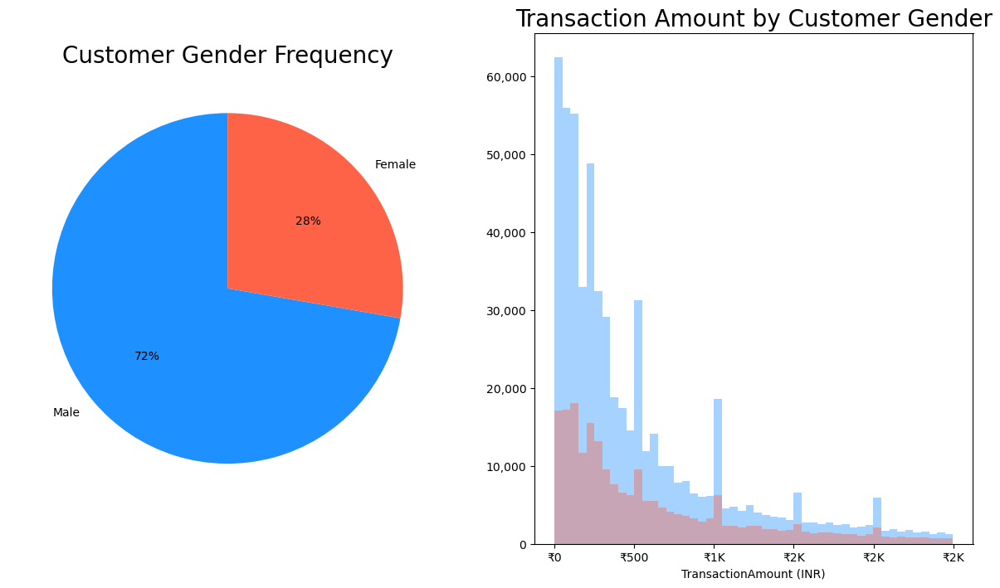

In [83]:
def currency(x, pos):
    """The two arguments are the value and tick position"""
    if x >= 1e6:
        s = '₹{:1.1f}M'.format(x*1e-6)
    elif x >= 1e3:
        s = '₹{:1.0f}K'.format(x*1e-3)
    else:
        s = '₹{:1.0f}'.format(x)
    return s

fig, axs = plt.subplots(ncols = 2,nrows = 1, figsize = (15, 8))

axs[0].pie(df_copy['CustGender'].value_counts(), autopct= '%1.f%%', labels = ['Male', 'Female'], startangle = 90, colors = ['dodgerblue', 'tomato'])
axs[0].set_title("Customer Gender Frequency", size = 20)

axs[1] = sns.distplot(df_copy[(df_copy['CustGender'] == 'Male') & (df_copy['TransactionAmount (INR)'] < np.percentile(df_copy['TransactionAmount (INR)'], 90))]['TransactionAmount (INR)'],
                     label = True, kde = False, color = 'dodgerblue')
axs[1] = sns.distplot(df_copy[(df_copy['CustGender'] == 'Female') & (df_copy['TransactionAmount (INR)'] < np.percentile(df_copy['TransactionAmount (INR)'],90))]['TransactionAmount (INR)'],
                     label = 'Female', kde = False, color = 'tomato')
axs[1].set_title("Transaction Amount by Customer Gender", size = 20)

import matplotlib.ticker as ticker
axs[1].xaxis.set_major_formatter(currency)
axs[1].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plt.show()

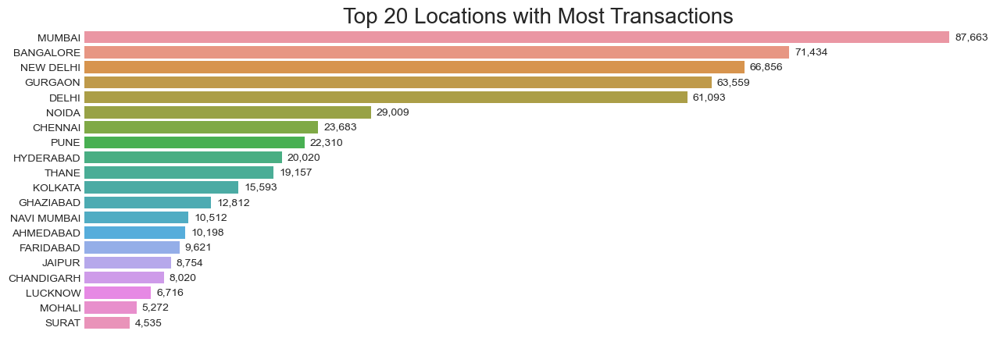

In [84]:
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(figsize=(15, 5))

sns.countplot(y='CustLocation', data=df_copy,
              order=df_copy['CustLocation'].value_counts()[:20].index, ax=ax)

ax.set_title("Top 20 Locations with Most Transactions", fontsize='20')
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.set_xticklabels([])
ax.xaxis.grid(False)

# Remove figure border
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)

# Add data labels
for p in ax.patches:
    ax.annotate(format(int(p.get_width()), ','),
                (p.get_width(), p.get_y() + p.get_height() / 2),
                xytext=(5, 0), textcoords='offset points', ha='left', va='center')

plt.show()

C:\Users\mzing\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



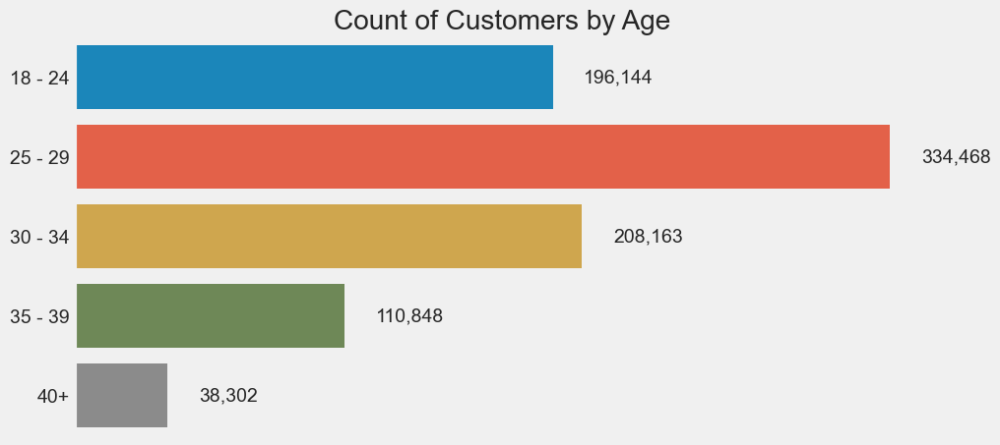

In [87]:
bins = [18,24,29,34,39,42]
labels = ['18 - 24', '25 - 29', '30 - 34', '35 - 39', '40+']
# labels = ['0 - 20', '20 - 30', '30 - 40', '40 - 50', '50 - 60', '60+']
df_copy['AgeBin'] = pd.cut(x = df_copy['CustAge'], bins = bins, labels = labels, right = True)

plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(figsize = (10, 5))
sns.countplot(df_copy, y = 'AgeBin', order = labels)

ax.set_xlabel(None)
ax.set_ylabel(None)
ax.set_title('Count of Customers by Age')
ax.set_xticklabels([])
ax.xaxis.grid(False)

# Add data labels at the end of the bars
for p in ax.patches:
    width = p.get_width()
    label = format(int(width), ',')  # Convert width to integer before formatting
    x = width + 10000 if width < 700000 else width - 10000  # Adjusted x-coordinate for label position
    ax.annotate(label,
                xy=(x, p.get_y() + p.get_height() / 2),
                xytext=(5, 0),
                textcoords="offset points",
                ha='left' if width < 700000 else 'right',  # Adjusted horizontal alignment
                va='center')

plt.show()

In [48]:
df_copy.groupby('CustAge')['TransactionAmount (INR)'].describe()

,count,mean,std,min,25%,50%,75%,max
CustAge,,,,,,,,
18,1341.0,1420.791275,4877.457536,0.0,65.0000,210.00,623.000,56368.23
19,7155.0,834.860451,3778.948402,0.0,60.0000,200.00,510.500,200001.24
20,12480.0,730.240849,2336.831226,0.0,58.0000,200.00,547.000,63826.00
21,20704.0,742.693744,2702.894780,0.0,55.0000,200.00,563.000,100000.00
22,36179.0,752.878122,2855.816597,0.0,60.0000,200.00,580.000,158134.00
23,53142.0,865.602251,4347.514790,0.0,80.0000,235.00,614.075,350000.00
24,66484.0,850.958144,3229.371478,0.0,100.0000,254.00,700.000,310002.83
25,71185.0,940.950004,3160.357131,0.0,100.0000,295.00,779.000,130000.00
26,72616.0,1018.438533,3387.509456,0.0,102.7500,300.00,850.000,150000.00


Text(0.5, 1.0, "Pearson's Correlation heatmap")

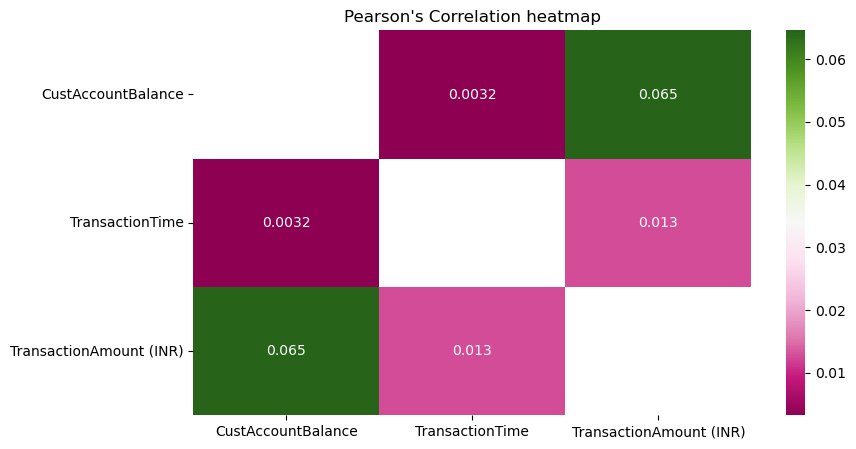

In [19]:
# Select only the numerical columns for the correlation matrix
numerical_df = df_copy.select_dtypes(include=['float64', 'int64'])

# calculate correlations in dataset
corr=abs(numerical_df.corr())

# plot correlations using heatmap
plt.figure(figsize=(9,5))
sns.heatmap(corr[corr<1], cmap='PiYG', annot=True)
plt.title("Pearson's Correlation heatmap")

# RFM Segmentation

RFM model is commonly used in marketing to segment customers based on their shopping behaviors, then treat each segment with targeted strategies. The three metrics used in the segmentation are:

- Recency: How many days since the customer's last transaction date? The lower the value, the more loyal the customers are to the company.
- Frequency: How many times did the customer make transactions during the period? The higher the value, the more active the customers are to our products and services.
- Monetary: The total amount of transactions or money spent by the customer during the period. This is the most important metric in the model. The higher the value, the more monetary value the customer could bring to the company

In [12]:
reference_date = df_copy['TransactionDate'].max() + timedelta(days=1)

In [13]:
reference_date

Timestamp('2016-12-10 00:00:00')

In [14]:
df_copy.head()

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR),CustAge
0,T1,C5841053,1994-10-01,Female,JAMSHEDPUR,17819.05,2016-02-08,143207,25.0,22
2,T3,C4417068,1996-11-26,Female,MUMBAI,17874.44,2016-02-08,142712,459.0,20
4,T5,C9031234,1988-03-24,Female,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.5,28
6,T7,C7126560,1992-01-26,Female,MUMBAI,973.46,2016-02-08,173806,566.0,24
7,T8,C1220223,1982-01-27,Male,MUMBAI,95075.54,2016-02-08,170537,148.0,34


In [15]:
rfm = df_copy.groupby('CustomerID').agg({
    'TransactionDate': lambda x: (reference_date - x.max()).days,
    'TransactionID': 'count',
    'TransactionAmount (INR)': 'sum'
})

In [16]:
rfm.rename(columns={'TransactionDate': 'Recency', 'TransactionID': 'Frequency', 'TransactionAmount (INR)': 'Value'}, inplace=True)

In [17]:
rfm

,Recency,Frequency,Value
CustomerID,,,
C1010011,75,2,5106.0
C1010012,118,1,1499.0
C1010014,155,2,1455.0
C1010018,86,1,30.0
C1010028,103,1,557.0
...,...,...,...
C9099836,155,1,691.0
C9099877,86,1,222.0
C9099919,114,1,126.0


In [18]:
# Define quantiles
quantiles = rfm.quantile(q=[0.25, 0.5, 0.75])

# Assign RFM Scores
def RScore(x, p, d):
    if p == 'Recency':
        if x <= d[p][0.25]:
            return 4
        elif x <= d[p][0.50]:
            return 3
        elif x <= d[p][0.75]:
            return 2
        else:
            return 1
    else:
        if x <= d[p][0.25]:
            return 1
        elif x <= d[p][0.50]:
            return 2
        elif x <= d[p][0.75]:
            return 3
        else:
            return 4

rfm['R'] = rfm['Recency'].apply(RScore, args=('Recency', quantiles,))
rfm['F'] = rfm['Frequency'].apply(RScore, args=('Frequency', quantiles,))
rfm['M'] = rfm['Value'].apply(RScore, args=('Value', quantiles,))

rfm.head()

,Recency,Frequency,Value,R,F,M
CustomerID,,,,,,
C1010011,75,2,5106.0,4,4,4
C1010012,118,1,1499.0,2,1,4
C1010014,155,2,1455.0,2,4,4
C1010018,86,1,30.0,4,1,1
C1010028,103,1,557.0,3,1,3


## RFM Segment

In [19]:
rfm['RFM_Segment'] = rfm['R'].astype(str) + rfm['F'].astype(str) + rfm['M'].astype(str)

In [20]:
rfm

,Recency,Frequency,Value,R,F,M,RFM_Segment
CustomerID,,,,,,,
C1010011,75,2,5106.0,4,4,4,444
C1010012,118,1,1499.0,2,1,4,214
C1010014,155,2,1455.0,2,4,4,244
C1010018,86,1,30.0,4,1,1,411
C1010028,103,1,557.0,3,1,3,313
...,...,...,...,...,...,...,...
C9099836,155,1,691.0,2,1,3,213
C9099877,86,1,222.0,4,1,2,412
C9099919,114,1,126.0,2,1,1,211


## RFM Score

In [22]:
rfm['RFM_Score'] = rfm[['R', 'F', 'M']].sum(axis=1)

In [23]:
rfm

,Recency,Frequency,Value,R,F,M,RFM_Segment,RFM_Score
CustomerID,,,,,,,,
C1010011,75,2,5106.0,4,4,4,444,12
C1010012,118,1,1499.0,2,1,4,214,7
C1010014,155,2,1455.0,2,4,4,244,10
C1010018,86,1,30.0,4,1,1,411,6
C1010028,103,1,557.0,3,1,3,313,7
...,...,...,...,...,...,...,...,...
C9099836,155,1,691.0,2,1,3,213,6
C9099877,86,1,222.0,4,1,2,412,7
C9099919,114,1,126.0,2,1,1,211,4


## RFM Segment Labels

In [24]:
segment_labels = ['Low-Value', 'Mid-Value', 'High-Value']

def assign_segment(score):
    if score < 5:
        return 'Low-Value'
    elif score < 9:
        return 'Mid-Value'
    else:
        return 'High-Value'

rfm['RFM_Segment_labels'] = rfm['RFM_Score'].apply(assign_segment)

In [25]:
rfm.head()

,Recency,Frequency,Value,R,F,M,RFM_Segment,RFM_Score,RFM_Segment_labels
CustomerID,,,,,,,,,
C1010011,75,2,5106.0,4,4,4,444,12,High-Value
C1010012,118,1,1499.0,2,1,4,214,7,Mid-Value
C1010014,155,2,1455.0,2,4,4,244,10,High-Value
C1010018,86,1,30.0,4,1,1,411,6,Mid-Value
C1010028,103,1,557.0,3,1,3,313,7,Mid-Value


# EDA

In [28]:
segment_counts = rfm['RFM_Segment_labels'].value_counts().reset_index()
segment_counts.columns = ['RFM_Segment', 'Count']
segment_counts = segment_counts.sort_values('RFM_Segment')

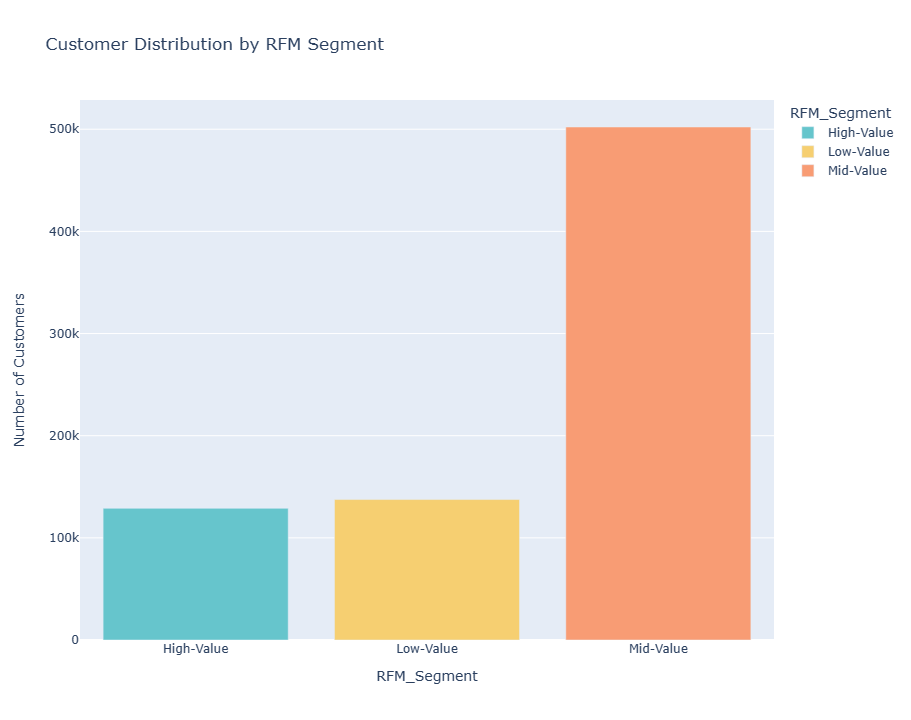

In [29]:
fig = px.bar(segment_counts,
             x = 'RFM_Segment',
             y = 'Count',
             title = 'Customer Distribution by RFM Segment',
             labels = {'RFM_Segment': 'RFM_Segment', 'Count': 'Number of Customers'},
             color = 'RFM_Segment',
             color_discrete_sequence = px.colors.qualitative.Pastel)

fig.show()   


In [30]:
rfm['RFM_Customer_Segments'] = ''

rfm.loc[rfm['RFM_Score'] >= 9, 'RFM_Customer_Segments'] = 'VIP/Loyal'
rfm.loc[(rfm['RFM_Score'] >= 6) & (rfm['RFM_Score'] < 9), 'RFM_Customer_Segments'] = 'Potential Loyal'
rfm.loc[(rfm['RFM_Score'] >= 5) & (rfm['RFM_Score'] < 6), 'RFM_Customer_Segments'] = 'At Risk Customers'
rfm.loc[(rfm['RFM_Score'] >= 4) & (rfm['RFM_Score'] < 5), 'RFM_Customer_Segments'] = "Can't Lose"
rfm.loc[(rfm['RFM_Score'] >= 3) & (rfm['RFM_Score'] < 4), 'RFM_Customer_Segments'] = 'Lost'
segment_counts = rfm['RFM_Customer_Segments'].value_counts().sort_index()

In [31]:
segment_product_counts = rfm.groupby(['RFM_Segment_labels', 'RFM_Customer_Segments']).size().reset_index(name='Count')

segment_product_counts = segment_product_counts.sort_values('Count', ascending=False)

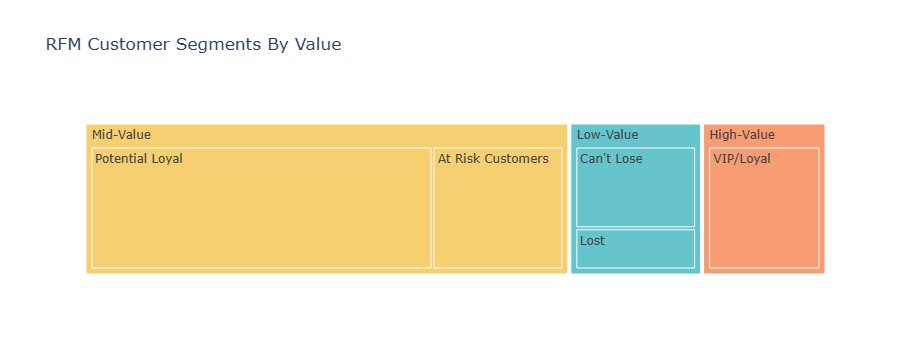

In [32]:
fig_treemap_segment_product = px.treemap(segment_product_counts,
                                         path = ['RFM_Segment_labels', 'RFM_Customer_Segments'],
                                         values = 'Count',
                                         color = 'RFM_Segment_labels',
                                         color_discrete_sequence = px.colors.qualitative.Pastel,
                                         title = 'RFM Customer Segments By Value')

fig_treemap_segment_product.show()

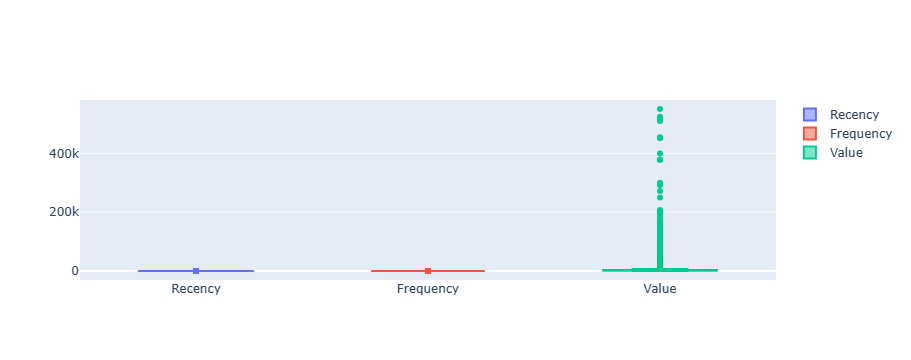

In [37]:
vip_segment = rfm[rfm['RFM_Customer_Segments'] == 'VIP/Loyal']  

fig = go.Figure()
fig.add_trace(go.Box(y=vip_segment['Recency'], name='Recency'))
fig.add_trace(go.Box(y=vip_segment['Frequency'], name='Frequency'))
fig.add_trace(go.Box(y=vip_segment['Value'], name='Value'))

In [33]:
vip_segment = rfm[rfm['RFM_Customer_Segments'] == 'VIP/Loyal']
correlation_matrix = vip_segment[['R', 'F', 'M']].corr()

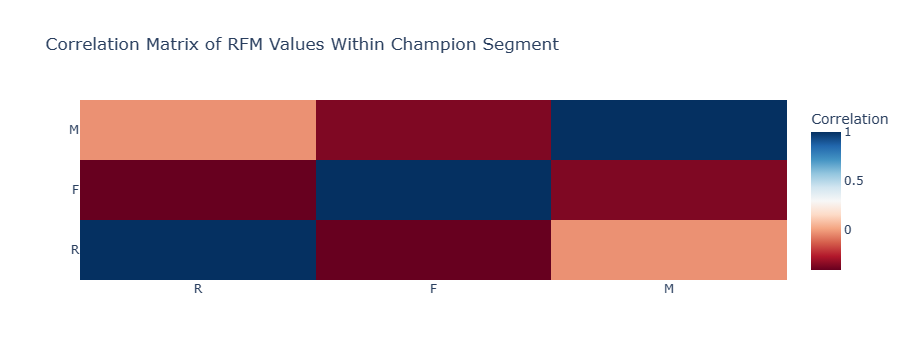

In [34]:
fig_heatmap = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='RdBu',
    colorbar=dict(title='Correlation')))

fig_heatmap.update_layout(title='Correlation Matrix of RFM Values Within Champion Segment')

fig_heatmap.show()

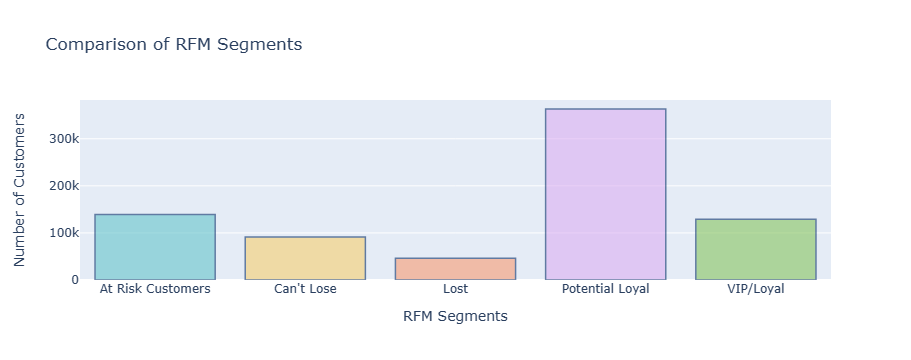

In [35]:
pastel_colors = plotly.colors.qualitative.Pastel

fig = go.Figure(data=[go.Bar(x=segment_counts.index, y=segment_counts.values,
                             marker=dict(color=pastel_colors))])

vip_color = 'rgb(158, 202, 225)'

fig.update_traces(marker_color=[vip_color if segment == 'Champions' else pastel_colors[i]
                                for i, segment in enumerate(segment_counts.index)],
                  marker_line_color = 'rgb(8, 48, 107)',
                  marker_line_width = 1.5, opacity = 0.6)

fig.update_layout(title='Comparison of RFM Segments',
                  xaxis_title='RFM Segments',
                  yaxis_title='Number of Customers',
                  showlegend=False)

fig.show()

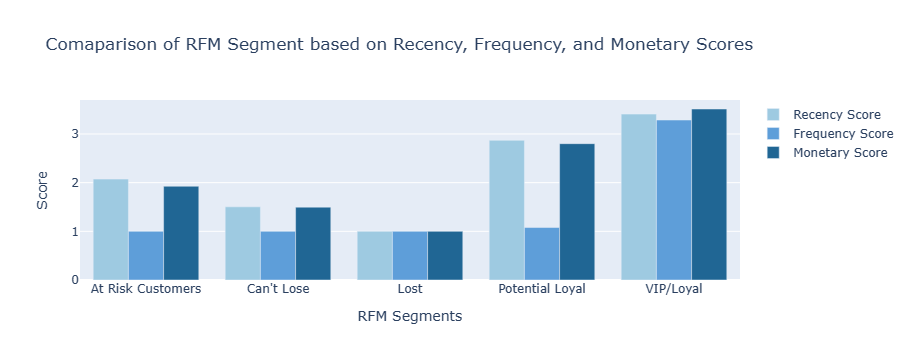

In [36]:
segment_scores = rfm.groupby('RFM_Customer_Segments')[['R', 'F', 'M']].mean().reset_index()
fig = go.Figure()

fig.add_trace(go.Bar(
    x=segment_scores['RFM_Customer_Segments'],
    y=segment_scores['R'],
    name='Recency Score',
    marker_color='rgb(158,202,225)'
))

fig.add_trace(go.Bar(
    x=segment_scores['RFM_Customer_Segments'],
    y=segment_scores['F'],
    name='Frequency Score',
    marker_color='rgb(94,158,217)'
))

fig.add_trace(go.Bar(
    x=segment_scores['RFM_Customer_Segments'],
    y=segment_scores['M'],
    name='Monetary Score',
    marker_color='rgb(32,102,148)'
))

fig.update_layout(
    title='Comaparison of RFM Segment based on Recency, Frequency, and Monetary Scores',
    xaxis_title='RFM Segments',
    yaxis_title='Score',
    barmode='group',
    showlegend=True
)

fig.show()

# K-Means Clustering

In [26]:
pd.set_option('display.max_columns', None)
df_merged  = pd.merge(df_copy, rfm , on='CustomerID', how='inner') 
df_merged.head()

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR),CustAge,Recency,Frequency,Value,R,F,M,RFM_Segment,RFM_Score,RFM_Segment_labels
0,T1,C5841053,1994-10-01,Female,JAMSHEDPUR,17819.05,2016-02-08,143207,25.0,22,306,1,25.0,1,1,1,111,3,Low-Value
1,T3,C4417068,1996-11-26,Female,MUMBAI,17874.44,2016-02-08,142712,459.0,20,306,1,459.0,1,1,2,112,4,Low-Value
2,T5,C9031234,1988-03-24,Female,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.5,28,306,1,1762.5,1,1,4,114,6,Mid-Value
3,T7,C7126560,1992-01-26,Female,MUMBAI,973.46,2016-02-08,173806,566.0,24,62,4,821.0,4,4,3,443,11,High-Value
4,T835790,C7126560,1988-02-21,Male,AURANGABAD,2052.35,2016-04-09,124043,36.0,28,62,4,821.0,4,4,3,443,11,High-Value


In [27]:
df_merged.to_csv('dataset/rfm_customers.csv',index=False)

In [33]:
features = ["CustAge", "Recency", "Frequency", "Value"]

In [34]:
df_merged  = df_merged.dropna(subset=features)

In [35]:
data = df_merged[features].copy()

In [36]:
data.head()

,CustAge,Recency,Frequency,Value
0,22,306,1,25.0
1,20,306,1,459.0
2,28,306,1,1762.5
3,24,62,4,821.0
4,28,62,4,821.0


# steps

1. scale the data
2. initialize random centroids
3. label each data point
4. update centroids
5. repeat step 3 and 4 until centroids stop changing

In [38]:
data = ((data - data.min()) / (data.max() - data.min())) * 9 + 1

In [40]:
data.head()

,CustAge,Recency,Frequency,Value
0,2.50,9.169643,1.0,1.000144
1,1.75,9.169643,1.0,1.002648
2,4.75,9.169643,1.0,1.010168
3,3.25,2.633929,6.4,1.004736
4,4.75,2.633929,6.4,1.004736


In [51]:
def random_centroids(data, k):
    centroids = []
    for i in range(k):
        centroid = data.apply(lambda x: float(x.sample()))
        centroids.append(centroid)
    return pd.concat(centroids, axis=1)

In [52]:
centroids = random_centroids(data, 5)

C:\Users\mzing\AppData\Local\Temp\ipykernel_9368\1845334667.py:4: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  centroid = data.apply(lambda x: float(x.sample()))


In [53]:
centroids

,0,1,2,3,4
CustAge,5.875000,4.375000,7.375000,3.625000,4.000000
Recency,2.312500,3.196429,4.107143,1.830357,7.535714
Frequency,2.800000,1.000000,2.800000,1.000000,1.000000
Value,1.001823,1.000277,1.004038,1.000288,1.010096


In [56]:
def get_labels(data, centroids):
    distances = centroids.apply(lambda x: np.sqrt(((data - x) ** 2).sum(axis=1)))
    return distances.idxmin(axis=1)

In [57]:
labels = get_labels(data, centroids)

In [58]:
labels.value_counts()

1    358319
2    181379
4    163631
0    104069
3     81868
Name: count, dtype: int64

In [59]:
def new_centroids(data, labels, k):
    return data.groupby(labels).apply(lambda x: np.exp(np.log(x).mean())).T

In [61]:
from sklearn.decomposition import PCA
from IPython.display import clear_output

In [62]:
def plot_clusters(data, labels, centroids, iteration):
    pca = PCA(n_components=2)
    data_2d = pca.fit_transform(data)
    centroids_2d = pca.transform(centroids.T)
    clear_output(wait=True)
    plt.title(f'Iteration {iteration}')
    plt.scatter(x=data_2d[:,0], y=data_2d[:,1], c=labels)
    plt.scatter(x=centroids_2d[:,0], y=centroids_2d[:,1])
    plt.show()

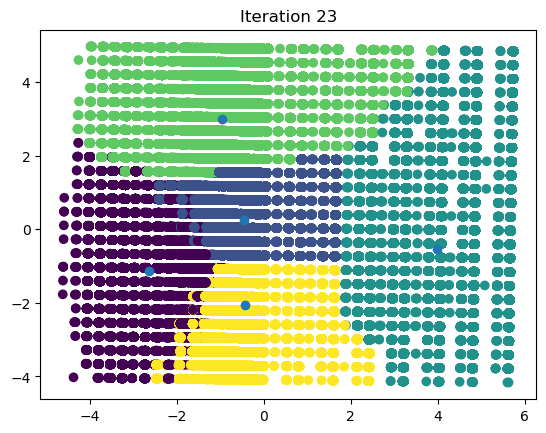

In [68]:
max_iterations = 100
k = 5

centroids = random_centroids(data, k)
old_centroids = pd.DataFrame()
iteration = 1

while iteration < max_iterations and not centroids.equals(old_centroids):
    old_centroids = centroids
    labels = get_labels(data, centroids)
    centroids = new_centroids(data, labels, k)
    plot_clusters(data, labels, centroids, iteration)
    iteration += 1

In [69]:
centroids

,0,1,2,3,4
CustAge,3.927719,5.325734,4.609609,8.086077,3.037393
Recency,1.732741,3.837431,8.299167,3.314120,3.885203
Frequency,1.933810,1.291849,1.062344,1.405105,1.280589
Value,1.011047,1.009304,1.007636,1.012938,1.006712


## Observation

**Cluster 0 (Young, Frequent, Recent)**: This cluster likely represents younger customers who transact frequently and recently, with moderate transaction values.

**Cluster 1 (Older, Less Frequent, Less Recent)**: This cluster might include older customers who transact less frequently and less recently, with similar transaction values.

**Cluster 2 (Moderate Age, Infrequent, Not Recent)**: These customers are of moderate age but haven’t transacted recently and do so infrequently, with consistent transaction values. These customers are at risk of churn

**Cluster 3 (Older, Moderate Frequency, Recent)**: This cluster could represent much older customers who transact moderately frequently and recently, with similar transaction values.

**Cluster 4 (Young, Less Frequent, Less Recent)**: This cluster likely includes younger customers who transact less frequently and less recently, with consistent transaction values.

In [75]:
from sklearn.cluster import KMeans

In [76]:
kmeans = KMeans(5)
kmeans.fit(data)

C:\Users\mzing\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=5)

In [77]:
centroids =kmeans.cluster_centers_

In [78]:
pd.DataFrame(centroids, columns=features).T

,0,1,2,3,4
CustAge,4.091548,3.900466,7.474896,3.892756,7.373429
Recency,3.169986,7.876025,3.437066,3.505614,7.880062
Frequency,3.185778,1.130041,1.531199,1.000000,1.131709
Value,1.015086,1.006925,1.012409,1.005852,1.010846
